<a href="https://colab.research.google.com/github/moey920/NLP/blob/master/Detectron2_semi_haram03_17.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2. Detectron2 설치하기

In [1]:
# 종속 패키지(dependencies) 설치, 설치후에 Restart Runtime이 나오면 클릭해줍니다.
!pip install -U torch torchvision cython
!pip install -U 'git+https://github.com/facebookresearch/fvcore.git' 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__

Requirement already up-to-date: torch in /usr/local/lib/python3.6/dist-packages (1.4.0)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.6/dist-packages (0.5.0)
Requirement already up-to-date: cython in /usr/local/lib/python3.6/dist-packages (0.29.15)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-gp6a2y6x
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-gp6a2y6x
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-kxpo1b87
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-kxpo1b87
     |████████████████████████████████| 276kB 22.3MB/s 
  Created wheel for fvcore: filename=fvcore-0.1-cp36-none-any.whl size=42820 sha256=7e7f2e41083ce0c32c31061cf4b76f23449a1c89b5c4a09455a8ee576f5a058a
  Stored in directory: /tmp/pip-ephem-wheel-cache-8a5kvopr/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
  Created wheel 

'1.4.0'

In [2]:
# Detectiorn2 repo 클론, 인스톨
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 3420, done.
remote: Total 3420 (delta 0), reused 0 (delta 0), pack-reused 3420
Receiving objects: 100% (3420/3420), 2.12 MiB | 11.40 MiB/s, done.
Resolving deltas: 100% (2359/2359), done.
Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 61kB 9.2MB/s 
  Found existing installation: tqdm 4.28.1
    Uninstalling tqdm-4.28.1:
      Successfully uninstalled tqdm-4.28.1
  Running setup.py develop for detectron2


In [0]:
# 인스톨이 완료되면 Colab Runtime을 다시 시작해주세요. 

# 기본 설정
# detectron2 logger 설정
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# 자주 사용하는 라이브러리 임폴트
import numpy as np
import cv2
import random
import os
from google.colab.patches import cv2_imshow

# 자주 사용하는 detectron2 유틸 임폴트 
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# 1. Google Drive Api

In [0]:
# Google Drive api 활용, PyDrive package 인스톨
!pip install -U -q PyDrive

In [0]:
# Auth 승인을 받습니다. 코드 실행 시 링크가 나오면 들어가서 계정을 인증하고 인증 코드를 복사해 붙여넣습니다.
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
   
# PyDrive Authentication
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
# Folder Id로 FileList 받아오기
# 폴더 ID는 개인 드라이브에서 폴더에 들어가면 https://drive.google.com/drive/folders/ 이후에 나오는 주소입니다.
folder_id = '1ee9JuXigFkrkyIFuTv44tUG7M6ysmZkd'
#folder_id = '1R4bFN-68jn0Ug-gX4nWYTV0C87x6QN_2'
   
def ListFolder(parent):
    filelist=[]
    file_list = drive.ListFile({'q': "'%s' in parents and trashed=false" % parent}).GetList()
    for f in file_list:
        if f['mimeType']=='application/vnd.google-apps.folder': # if folder
            filelist.append({"id":f['id'],"title":f['title'],"list":ListFolder(f['id'])})
        else:
            filelist.append({"title":f['title'],"id":f['id']})
    return filelist
   
   
file_lists = ListFolder(folder_id)

In [0]:
# Local (colaboratory) directory 지정
# choose a local (colab) directory to store the data.
import os

local_download_path = os.path.expanduser('')
try:
	os.makedirs(local_download_path)
except: pass

In [7]:
# Filename 저장, 여기까지 하면 구글 드라이브 폴더 내의 파일을 Colab에 지정한 장소에 업로드 됩니다.
ret = []
for file in file_lists:
    print('title: %s, id: %s' % (file['title'], file['id']))
    fname = os.path.join(local_download_path, file['title'])
    print('downloading to {}'.format(fname))
    f_ = drive.CreateFile({'id': file['id']})
    f_.GetContentFile(fname)
    print(fname)
    ret.append(fname)

title: dataset.zip, id: 1XH3N1OkdWUorud7UyyqJ5AUrW29rB7Yz
downloading to dataset.zip
dataset.zip


In [8]:
#import os
#os.chdir('receipt')
!ls

adc.json  dataset.zip  detectron2_repo	sample_data


In [0]:
# 업로드한 파일을 압축해제합니다.
!unzip dataset.zip > /dev/null

In [10]:
#os.chdir('../')
!ls

adc.json  dataset.zip  detectron2_repo	sample_data  train  val


# 커스텀 데이터셋 학습하기

In [0]:
# 인스톨이 완료되면 Colab Runtime을 다시 시작해주세요. 

# 기본 설정
# detectron2 logger 설정
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# 자주 사용하는 라이브러리 임폴트
import numpy as np
import cv2
import random
import os
from google.colab.patches import cv2_imshow
import matplotlib
import json

# 자주 사용하는 detectron2 유틸 임폴트 
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [0]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2

def get_receipt_dicts(img_path,json_path):
    '''
    AD Oct 2019 : loading function to calculate the bboxes from the masks (as it does not exist so far in Detectron2)
    expected format:
    
    {'file_name': 'path/to/image',
    'height' : imgheight,
    'width': imgwidth,
    'annotations':
    [{'bbox': [xmin,ymin,xmax,ymax], 'bbox_mode': <BoxMode.XYXY_ABS: 0>,
    'segmentation': [[polygon/coordinates/x/y]],
    'category_id': 0, 'iscrowd': 0}, 
    {'bbox': [xmin2,ymin2,xmax2,ymax2], 'bbox_mode': <BoxMode.XYXY_ABS: 0>,
    'segmentation': [[polygon2/coordinates/x/y]],
    'category_id': 0, 'iscrowd': 0},
    
    etc ...]
    
    }
    INPUTS:
        img_path . str, path to the images
        json_path. str, path to the json annotation file (coco format)
    
    '''
    
    with open(json_path) as f:
        imgs_anns = json.load(f)
    dataset_dicts = []
    
    for img in imgs_anns['images']:
        record = {}
        
        filename = os.path.join(img_path,img['file_name'])
        height, width = cv2.imread(filename).shape[:2]
        image_id = img['id']

        record["file_name"] = filename
        record["height"] = height
        record["width"] = width
        
        for annos in imgs_anns['annotations']:
            if annos['image_id'] == image_id:

                objs = []
                poly = annos['segmentation']
                 
                for p in poly:
                    bbox=[]
                    x, y = p[::2] , p[1::2]
                    bbox.append(np.min(x))
                    bbox.append(np.min(y))
                    bbox.append(np.max(x))
                    bbox.append(np.max(y))
                    obj = {"bbox": bbox,
                            "bbox_mode": BoxMode.XYXY_ABS,
                            "segmentation": [p],
                            "category_id": 0,
                            "iscrowd": 0}
                    objs.append(obj)

        
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances

register_coco_instances("train", {}, "train/receipt_coco.json",
                        "train/")

register_coco_instances("val", {}, "val/receipt_coco.json",
                        "val/")

receipt_metadata_train = MetadataCatalog.get("train")
receipt_metadata_val = MetadataCatalog.get("val")

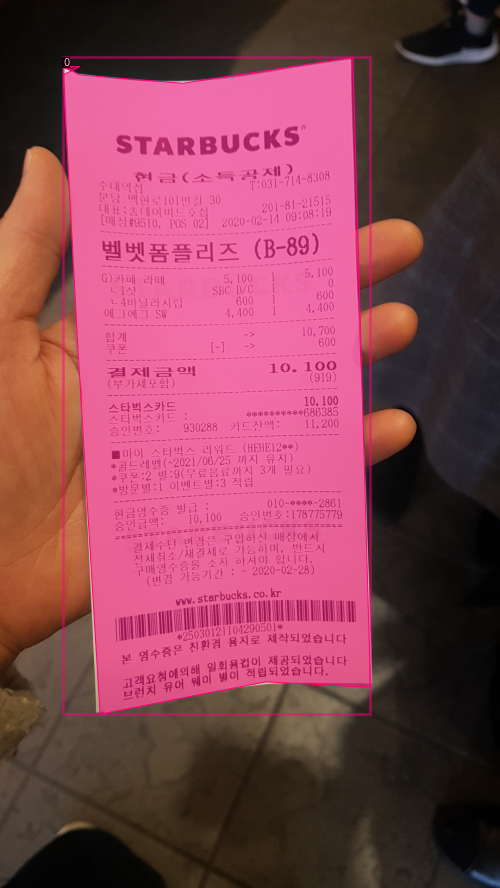

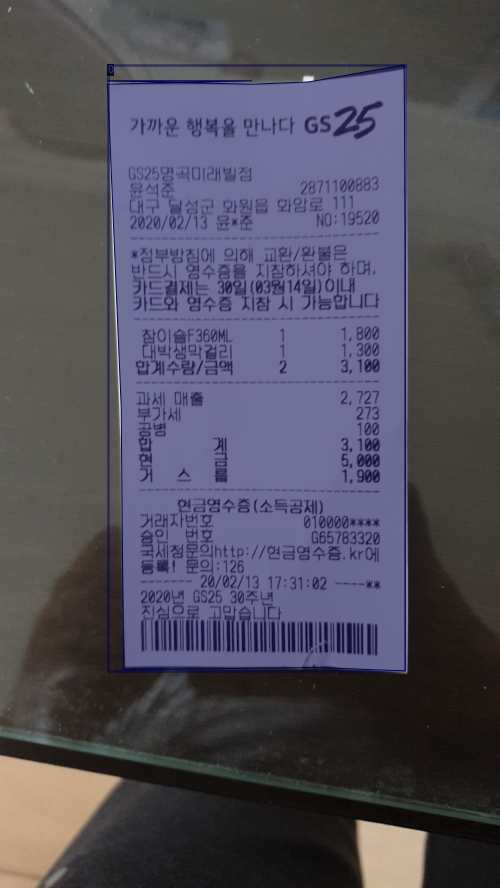

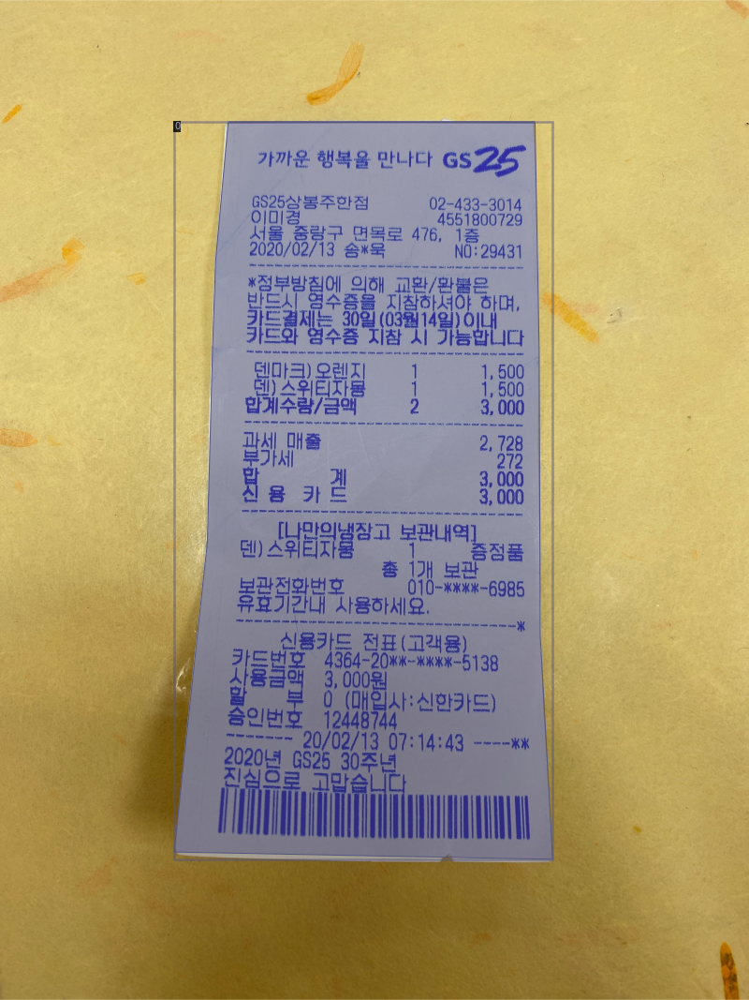

In [13]:
dataset_dicts = get_receipt_dicts("train","train/receipt_coco.json")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], receipt_metadata_train, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Object Detection

In [19]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-Detection/retinanet_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"   # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 900
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # 클래스는 "영수증" 클래스 하나 뿐입니다.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

Loading config ./detectron2_repo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


[03/17 08:23:48 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

In [20]:
# tensorboard를 사용해서 학습 커브를 살펴봅니다.
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 646), started 0:16:20 ago. (Use '!kill 646' to kill it.)

In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("val", )
predictor = DefaultPredictor(cfg)

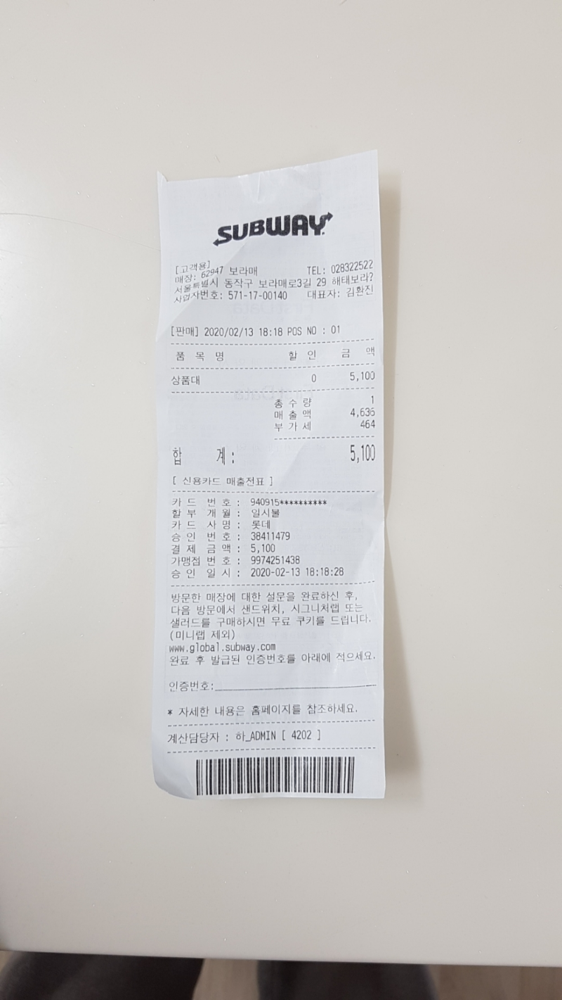

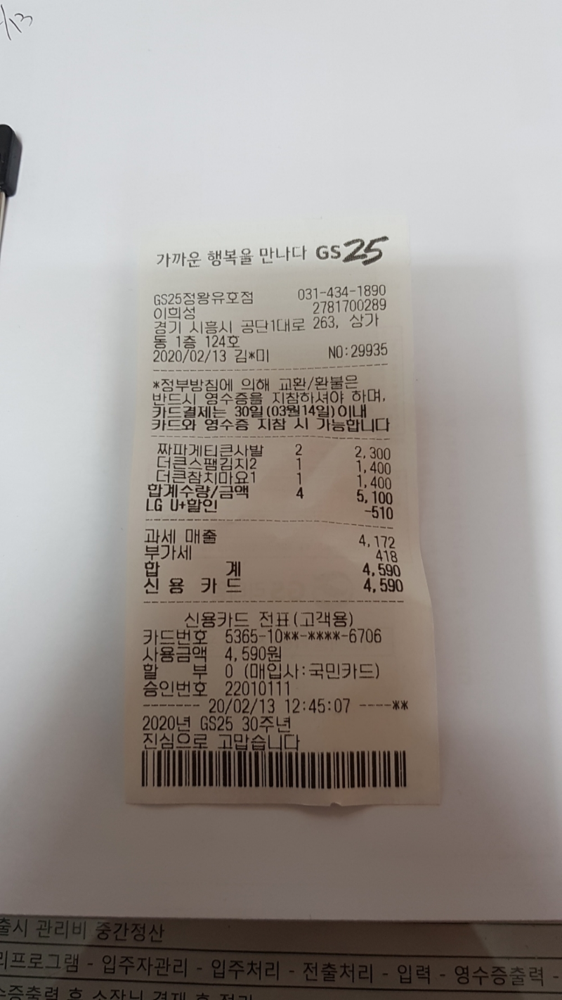

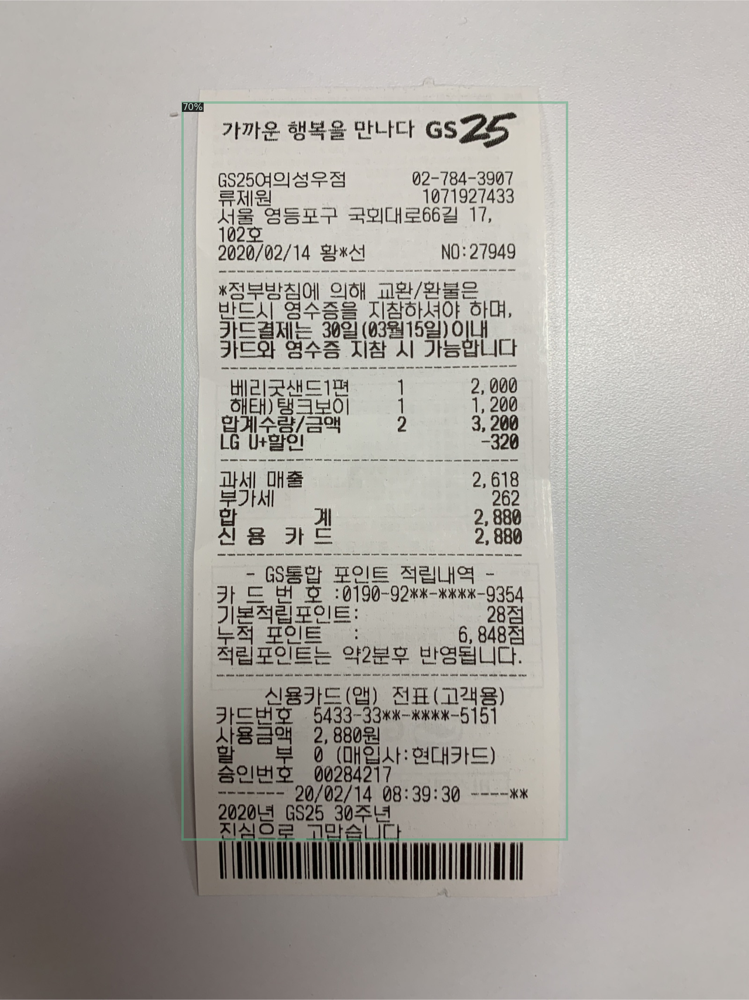

In [22]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_receipt_dicts("val","val/receipt_coco.json")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=receipt_metadata_train, 
                   scale=0.8
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [23]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

[03/17 08:35:37 d2.data.datasets.coco]: Loaded 100 images in COCO format from val/receipt_coco.json
[03/17 08:35:37 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[03/17 08:35:37 d2.data.common]: Serialized dataset takes 0.05 MiB
[03/17 08:35:37 d2.evaluation.evaluator]: Start inference on 100 images
[03/17 08:35:40 d2.evaluation.evaluator]: Inference done 11/100. 0.2303 s / img. ETA=0:00:20
[03/17 08:35:45 d2.evaluation.evaluator]: Inference done 34/100. 0.2226 s / img. ETA=0:00:14
[03/17 08:35:50 d2.evaluation.evaluator]: Inference done 57/100. 0.2232 s / img. ETA=0:00:09
[03/17 08:35:55 d2.evaluation.evaluator]: Inference done 79/100. 0.2247 s / img. ETA=0:00:04
[03/17 08:36:00 d2.evaluation.evaluator]: Total inference time: 0:00:21.534412 (0.226678 s / img per device, on 1 devices)
[03/17 08:36:00 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:21 (0.224312 s / img per device, on 1 devices)
[03/17 08:36:00 d2.evaluation.co

OrderedDict([('bbox',
              {'AP': 53.42934775653693,
               'AP50': 99.89216743456524,
               'AP75': 46.51192842056482,
               'APl': 53.42934775653693,
               'APm': nan,
               'APs': nan})])

# Instance Segmentation

이제 학습을 진행할 단계입니다. COCO 데이터셋으로 학습된 R50-FPN Mask R-CNN 모델을 불러와서 영수증 데이터셋으로 fine-tune해 봅시다. Colab의 K80 GPU를 기준으로, 300 iterations 학습시키는데 대략 6분정도의 시간이 소요됩니다(P100 GPU의 경우 2분 가량 소요됩니다).

In [19]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 900    # 300으로 시도하면 작동할지도 모르나, 낮은 반복값을 주면 에측값이 안나옵니다. 충분한 시간을 가지고 900으로 시도해주세요.
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 1024   # 영수증 데이터셋과 같이 적당한 데이터셋에서는 이정도면 적당합니다, 작은 데이터셋은 124로 하면 됩니다.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # 클래스는 "영수증" 클래스 하나 뿐입니다.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/17 07:53:22 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (2, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (2,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (4, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (4,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (1,) in the model! Skipped.


[03/17 07:53:22 d2.engine.train_loop]: Starting training from iteration 0
[03/17 07:53:56 d2.utils.events]:  eta: 0:24:56  iter: 19  total_loss: 1.356  loss_cls: 0.617  loss_box_reg: 0.042  loss_mask: 0.680  loss_rpn_cls: 0.001  loss_rpn_loc: 0.007  time: 1.7028  data_time: 0.0299  lr: 0.000005  max_mem: 3655M
[03/17 07:54:30 d2.utils.events]:  eta: 0:24:28  iter: 39  total_loss: 1.216  loss_cls: 0.518  loss_box_reg: 0.037  loss_mask: 0.642  loss_rpn_cls: 0.001  loss_rpn_loc: 0.009  time: 1.7063  data_time: 0.0068  lr: 0.000010  max_mem: 3655M
[03/17 07:55:03 d2.utils.events]:  eta: 0:23:54  iter: 59  total_loss: 0.957  loss_cls: 0.322  loss_box_reg: 0.036  loss_mask: 0.566  loss_rpn_cls: 0.001  loss_rpn_loc: 0.008  time: 1.6956  data_time: 0.0064  lr: 0.000015  max_mem: 3655M
[03/17 07:55:38 d2.utils.events]:  eta: 0:23:19  iter: 79  total_loss: 0.743  loss_cls: 0.191  loss_box_reg: 0.036  loss_mask: 0.499  loss_rpn_cls: 0.001  loss_rpn_loc: 0.010  time: 1.6998  data_time: 0.0069  lr:

KeyboardInterrupt: ignored

In [0]:
# tensorboard를 사용해서 학습 커브를 살펴봅니다.
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1050), started 0:13:24 ago. (Use '!kill 1050' to kill it.)

# 학습한 모델 실행 및 평가하기

영수증 데이터셋의 검증(validation) 데이터셋으로 테스트를 해볼 차례입니다.

우선, 방금 전 학습한 모델을 불러와서 predictor를 생성합니다.

In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("val", )
predictor = DefaultPredictor(cfg)

샘플을 몇 개 뽑아 살펴봅니다.

In [0]:
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import GenericMask
from detectron2.utils.visualizer import VisImage
from detectron2.structures import BitMasks, Boxes, BoxMode, Keypoints, PolygonMasks, RotatedBoxes
dataset_dicts = get_receipt_dicts("val","val/receipt_coco.json")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=receipt_metadata_train, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
                   #instance_mode=ColorMode.SEGMENTATION
                   #instance_mode = GenericMask.mask_to_polygons

    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])
    VisImage.save(v, "./output/")

In [0]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

[02/25 04:04:23 d2.data.datasets.coco]: Loaded 100 images in COCO format from val/receipt_coco.json
[02/25 04:04:23 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[02/25 04:04:23 d2.data.common]: Serialized dataset takes 0.05 MiB
[02/25 04:04:23 d2.evaluation.evaluator]: Start inference on 100 images
[02/25 04:04:25 d2.evaluation.evaluator]: Inference done 11/100. 0.1278 s / img. ETA=0:00:12
[02/25 04:04:30 d2.evaluation.evaluator]: Inference done 43/100. 0.1307 s / img. ETA=0:00:08
[02/25 04:04:35 d2.evaluation.evaluator]: Inference done 76/100. 0.1310 s / img. ETA=0:00:03
[02/25 04:04:39 d2.evaluation.evaluator]: Total inference time: 0:00:14.780643 (0.155586 s / img per device, on 1 devices)
[02/25 04:04:39 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:12 (0.130427 s / img per device, on 1 devices)
[02/25 04:04:39 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[02/25 04:04:39 d2.evaluation.coco_eval

OrderedDict([('bbox',
              {'AP': 91.95556602700198,
               'AP50': 100.0,
               'AP75': 100.0,
               'APl': 91.95556602700198,
               'APm': nan,
               'APs': nan}),
             ('segm',
              {'AP': 98.99368938095478,
               'AP50': 100.0,
               'AP75': 100.0,
               'APl': 98.99368938095478,
               'APm': nan,
               'APs': nan})])

In [0]:
!ls output

coco_instances_results.json			   last_checkpoint
events.out.tfevents.1582601990.7a036d2924cb.750.0  metrics.json
events.out.tfevents.1582602667.7a036d2924cb.750.1  model_final.pth
instances_predictions.pth


# 구글 드라이브에 모델 저장하기

In [0]:
# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# 2. Create & upload a file text file.
# 특정 폴더 안으로 파일 삽입
uploaded = drive.CreateFile({'title': 'coco_instances_results.json', "parents": [{"kind": "drive#fileLink","id": '1R4bFN-68jn0Ug-gX4nWYTV0C87x6QN_2'}]})
uploaded.SetContentString('Sample upload file content')
uploaded.SetContentFile('output/coco_instances_results.json')
uploaded.Upload()
print('Uploaded file with ID {}'.format(uploaded.get('id')))
# 3. Load a file by ID and print its contents.
downloaded = drive.CreateFile({'id': uploaded.get('id')})

Uploaded file with ID 1nIm14_ePpSgqytmjLrm3ZT1N7kF_apSM


In [0]:
for key in outputs.keys():
    print(key, ":", outputs[key])
    print(outputs['instances'].pred_masks)

instances : Instances(num_instances=1, image_height=1777, image_width=1000, fields=[pred_boxes: Boxes(tensor([[ 352.4471,   90.1074,  698.0569, 1481.3600]], device='cuda:0')), scores: tensor([0.9956], device='cuda:0'), pred_classes: tensor([0], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]], device='cuda:0')])
tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, Fal

In [0]:
with open('output/coco_instances_results.json') as f :
    json_data = json.load(f)
json_data

[{'bbox': [239.65811157226562,
   49.7718505859375,
   1010.1016845703125,
   2009.8682861328125],
  'category_id': 1,
  'image_id': 1,
  'score': 0.998367965221405,
  'segmentation': {'counts': 'WYfa0T1ji0WOg:a4SBlNR;k3kBfNo9^5kBkNi5d7bGP5`CT5e:Rj0[O;F9F:G8H8H8H7I7J6I6K6J5K4L5K5K4M4L3N3L3M4L4L4L4L4L4L5J5L5K4L5K5K5J6K6J5K5K4L3M4L3N2M3M2N3M2N3N1N3M2O1N2N2O000O101N10000O2O000O10001N10000O101O0O10000O2O00000O101O0O1000001N10000000000000000000000000000000000000000000000000000000000000000000000001O00O1000000000000000000000000000000000000000000000000000000000000000000000000O10000000000000000000000000000000000000000000000000000O100000000000000000000000000000000000000000000000000000000000000000000000000000000O100001O00000000000000000000000000000000000000001O000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000O1001O00000000000000000000000000001O00000000000000000000000001O01O00000000000000000000000000000000O100000000000000000000000000000000000000000000